<h1 style="text-align: center;"><b>Exploratory analysis of BTC market data</b></h1>

In [1]:
import numpy as np
import pandas as pd
from plotly.subplots import make_subplots
import plotly.express as px
import plotly.graph_objs as go

In [2]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

# Load data

First, let's load the data and look at it.

In [3]:
# I interpret 'LOBS' as 'limit order book stream'.
# I manually removed the column names prefixes and deleted a space before
# the 'exchange_ts' column
lobs_btc = pd.read_csv('../data/1/btcusdt:Binance:LinearPerpetual/lobs.csv')
trades_btc = pd.read_csv('../data/1/btcusdt:Binance:LinearPerpetual/trades.csv')

In [4]:
lobs_btc['receive_ts'] = pd.to_datetime(lobs_btc['receive_ts'])
lobs_btc['exchange_ts'] = pd.to_datetime(lobs_btc['exchange_ts'])
trades_btc['receive_ts'] = pd.to_datetime(trades_btc['receive_ts'])
trades_btc['exchange_ts'] = pd.to_datetime(trades_btc['exchange_ts'])

In [5]:
lobs_btc.head()

,receive_ts,exchange_ts,ask_price_0,ask_vol_0,bid_price_0,bid_vol_0,ask_price_1,ask_vol_1,bid_price_1,bid_vol_1,...,bid_price_7,bid_vol_7,ask_price_8,ask_vol_8,bid_price_8,bid_vol_8,ask_price_9,ask_vol_9,bid_price_9,bid_vol_9
0,2022-06-23 00:00:02.250125991,2022-06-23 00:00:02.249,19977.5,0.079,19977.4,12.381,19977.8,0.003,19976.7,0.066,...,19975.7,4.455,19980.1,0.01,19975.6,1.529,19980.2,0.01,19975.4,1.641
1,2022-06-23 00:00:02.657844605,2022-06-23 00:00:02.655,19977.5,0.078,19977.4,12.381,19977.8,0.003,19977.3,0.126,...,19975.9,0.246,19980.1,0.01,19975.8,0.686,19980.2,0.01,19975.7,4.455
2,2022-06-23 00:00:03.346968722,2022-06-23 00:00:03.346,19977.5,0.079,19977.4,12.381,19977.8,0.003,19977.3,0.126,...,19975.9,0.246,19980.1,0.01,19975.8,0.686,19980.2,0.01,19975.7,4.455
3,2022-06-23 00:00:04.080791047,2022-06-23 00:00:04.080,19977.5,0.079,19977.4,12.381,19977.8,0.003,19977.3,0.126,...,19975.9,0.246,19980.1,0.01,19975.8,0.686,19980.2,0.01,19975.7,4.455
4,2022-06-23 00:00:04.452706766,2022-06-23 00:00:04.452,19977.5,0.079,19977.4,12.381,19977.8,0.003,19977.3,0.126,...,19975.9,0.246,19980.1,0.01,19975.8,0.686,19980.2,0.01,19975.7,4.455


In [6]:
trades_btc.head()

,receive_ts,exchange_ts,aggro_side,price,size
0,2022-06-23 00:00:02.624789714,2022-06-23 00:00:02.623,BID,19977.5,0.001
1,2022-06-23 00:00:05.293556247,2022-06-23 00:00:05.292,BID,19977.5,0.041
2,2022-06-23 00:00:05.293628020,2022-06-23 00:00:05.292,BID,19977.5,0.036
3,2022-06-23 00:00:05.293832021,2022-06-23 00:00:05.292,BID,19977.5,0.001
4,2022-06-23 00:00:05.293929517,2022-06-23 00:00:05.292,BID,19977.5,0.001


# 1. Plots of best bid/ask levels and trade prices

In [7]:
def plot_history(lobs, trades, start, end, timeline):
    """
    Plot best bid/ask levels and trade prices.
    :param lobs: order book data.
    :param trades: trades data.
    :param start: start time.
    :param end: end time.
    :param timeline: 'receive_ts' or 'exchange_ts'.
    :return: plotly figure object.
    """

    lobs_mask = (lobs[timeline] > start) & (lobs[timeline] < end)
    trades_mask_ask = (trades[timeline] > start) & (trades[timeline] < end) & (trades['aggro_side'] == 'ASK')
    trades_mask_bid = (trades[timeline] > start) & (trades[timeline] < end) & (trades['aggro_side'] == 'BID')

    markers_sell_size = trades['size'][trades_mask_ask] / trades['size'].max() * 300
    markers_sell_size.mask(markers_sell_size < 4, 4, inplace=True)
    markers_buy_size = trades['size'][trades_mask_bid] / trades['size'].max() * 300
    markers_buy_size.mask(markers_buy_size < 4, 4, inplace = True)

    fig = make_subplots(rows=2, cols=1, row_heights=[0.7, 0.3], shared_xaxes=True, vertical_spacing=0.05)

    fig.add_trace(go.Scatter(
            name='Best bid',
            x=lobs[timeline][lobs_mask],
            y=lobs['bid_price_0'][lobs_mask],
            line=dict(color='green'),
            showlegend=True),
        row=1, col=1)

    fig.add_trace(go.Scatter(
            name='Best ask',
            x=lobs[timeline][lobs_mask],
            y=lobs['ask_price_0'][lobs_mask],
            line=dict(color='red'),
            showlegend=True),
        row=1, col=1)

    fig.add_trace(go.Scatter(
            name='Best bid 9',
            x=lobs[timeline][lobs_mask],
            y=lobs['bid_price_9'][lobs_mask],
            line=dict(color='darkgreen'),
            showlegend=True),
        row=1, col=1)

    fig.add_trace(go.Scatter(
            name='Best ask 9',
            x=lobs[timeline][lobs_mask],
            y=lobs['ask_price_9'][lobs_mask],
            line=dict(color='darkred'),
            showlegend=True),
        row=1, col=1)

    fig.add_trace(go.Scatter(
            name='Buy trade',
            x=trades[timeline][trades_mask_bid],
            y=trades['price'][trades_mask_bid],
            mode='markers',
            marker_size=markers_buy_size,
            marker_symbol='arrow-up-open',
            line=dict(color='blue', width=7),
            showlegend=True),
        row=1, col=1)

    fig.add_trace(go.Scatter(
            name='Sell trade',
            x=trades[timeline][trades_mask_ask],
            y=trades['price'][trades_mask_ask],
            mode='markers',
            line=dict(color='crimson'),
            marker_symbol='arrow-down-open',
            marker_size=markers_sell_size,
            showlegend=True),
        row=1, col=1)

    time_diff = (lobs[timeline][lobs_mask] - lobs[timeline][lobs_mask].shift()) / 10 ** 6
    fig.add_trace(go.Line(
            name='Time difference',
            y=time_diff,
            x=lobs[timeline][lobs_mask],
            showlegend=True
            ),
        row=2, col=1)

    fig.update_layout(xaxis2_title='Time', yaxis1_title='Price', yaxis2_title='Time difference, ms', title=f'Timeline: {timeline}')
    return fig

In [8]:
%%capture --no-display
start = '2022-06-23 00:26:00'
end = '2022-06-23 00:30:00'
plot_history(lobs_btc, trades_btc, start, end, timeline='receive_ts').show(renderer='browser');
plot_history(lobs_btc, trades_btc, start, end, timeline='exchange_ts').show(renderer='browser');

[5663:5688:1002/213018.945578:ERROR:bus.cc(399)] Failed to connect to the bus: Could not parse server address: Unknown address type (examples of valid types are "tcp" and on UNIX "unix")
[5663:5688:1002/213018.945667:ERROR:bus.cc(399)] Failed to connect to the bus: Could not parse server address: Unknown address type (examples of valid types are "tcp" and on UNIX "unix")


Opening in existing browser session.
Opening in existing browser session.


[5768:5793:1002/213020.681117:ERROR:bus.cc(399)] Failed to connect to the bus: Could not parse server address: Unknown address type (examples of valid types are "tcp" and on UNIX "unix")
[5768:5793:1002/213020.681158:ERROR:bus.cc(399)] Failed to connect to the bus: Could not parse server address: Unknown address type (examples of valid types are "tcp" and on UNIX "unix")


![lobs-trades-plot.png](pics/btc/lobs-trades-plot.png)

The legend can be found in the top right corner of a plot. The triangle size indicates the size of a trade.

When the trade volume per unit time is low, the spread is generally low (e.g. 00:26:25 - 00:26:30).

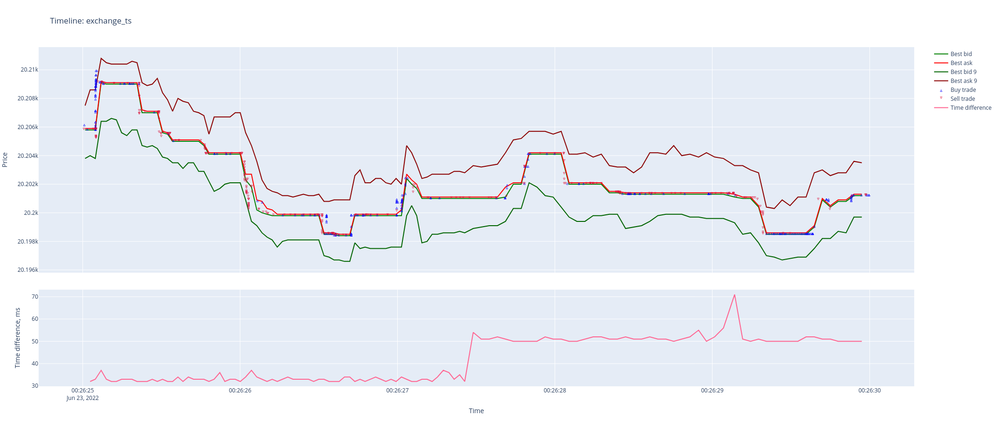

In [9]:
%%capture --no-display
start = '2022-06-23 00:26:25'
end = '2022-06-23 00:26:30'
fig = plot_history(lobs_btc, trades_btc, start, end, timeline='exchange_ts');
fig.update_layout(width=1300, height=900).show();

On the other hand, when the trade volume per unit time is high, the spread is also high. A good example of the latter can be observed in the time interval 00:26:59 - 00:27:10. During this period, a sequence of buy trades spikes occurs, each one "piercing" the seller's side of the order book, causing the spread to increase sharply.



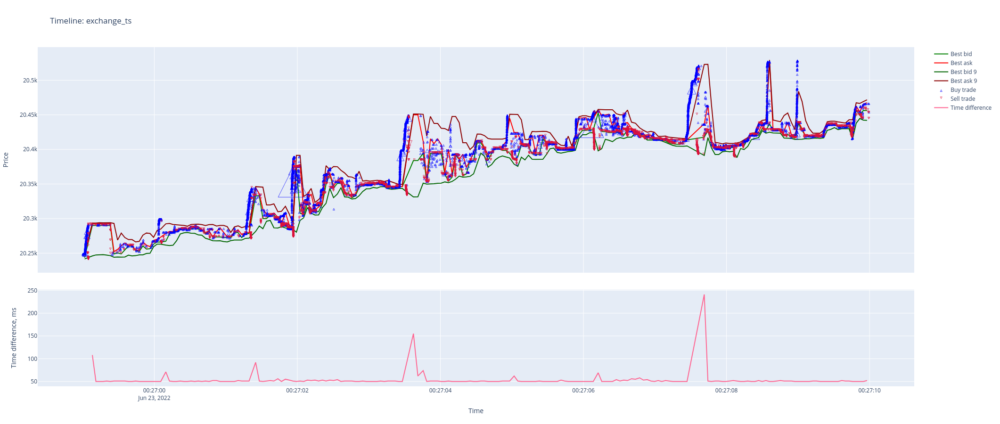

In [10]:
%%capture --no-display
start = '2022-06-23 00:26:59'
end = '2022-06-23 00:27:10'
fig = plot_history(lobs_btc, trades_btc, start, end, timeline='exchange_ts');
fig.update_layout(width=1300, height=900).show();

These spikes can be observed more closely, for example, in the interval 00:27:05 - 00:27:10.

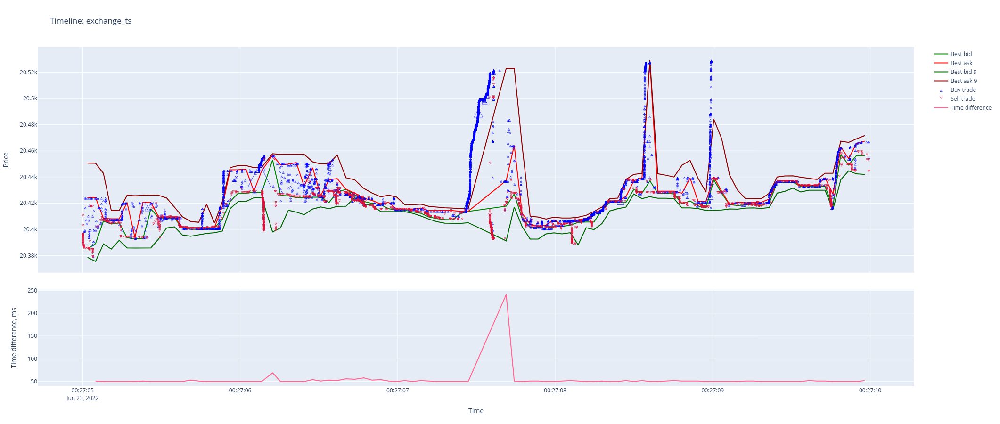

In [11]:
%%capture --no-display
start = '2022-06-23 00:27:05'
end = '2022-06-23 00:27:10'
fig = plot_history(lobs_btc, trades_btc, start, end, timeline='exchange_ts');
fig.update_layout(width=1300, height=900).show();

A great way to further improve the order book history visualization is adding a heatmap, where color is used to indicate the limit orders size at different price levels.

## Time difference between the nearest order book data points on the exchange timeline

Looking at the plot of time difference between the nearest order book data points, we can see that this difference is not constant. Seems like it mostly oscillates between 32 ms and 52 ms with some small noise (see the first plot), and it spikes significantly when the trading activity sharply increases (e.g. 00:26:45 - 00:27:15).

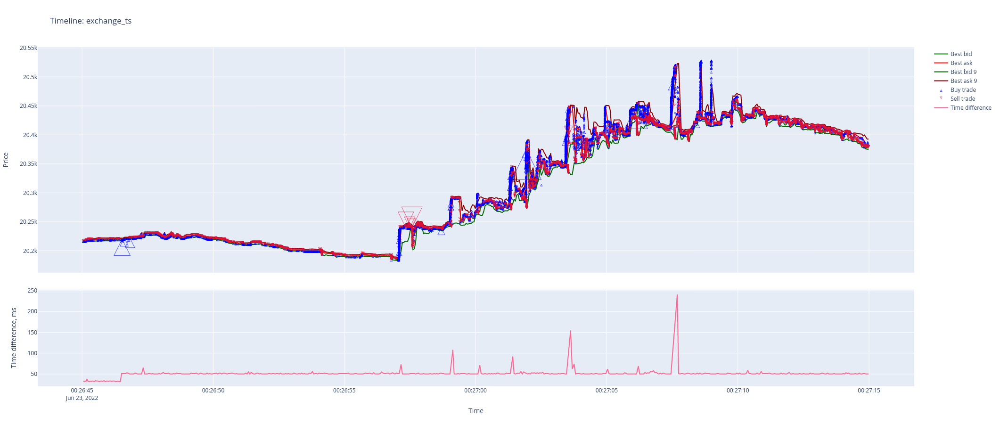

In [12]:
%%capture --no-display
start = '2022-06-23 00:26:45'
end = '2022-06-23 00:27:15'
fig = plot_history(lobs_btc, trades_btc, start, end, timeline='exchange_ts');
fig.update_layout(width=1300, height=900).show();

Let's look at the median value and different quantiles

In [13]:
print('Median exchange time difference between order book data points: ', end='')
print((lobs_btc['exchange_ts'] - lobs_btc['exchange_ts'].shift()).median())

Median exchange time difference between order book data points: 0 days 00:00:00.033000


In [14]:
quantiles = []
for i, q in enumerate(range(5, 100, 5)):
    quantiles.append((lobs_btc['exchange_ts'] - lobs_btc['exchange_ts'].shift()).quantile(q * 0.01))
    print(f'{q}% quantile:', quantiles[-1])

quantiles.append((lobs_btc['exchange_ts'] - lobs_btc['exchange_ts'].shift()).quantile(0.99))
print(f'99% quantile:', quantiles[-1])

5% quantile: 0 days 00:00:00.032000
10% quantile: 0 days 00:00:00.032000
15% quantile: 0 days 00:00:00.032000
20% quantile: 0 days 00:00:00.032000
25% quantile: 0 days 00:00:00.032000
30% quantile: 0 days 00:00:00.032000
35% quantile: 0 days 00:00:00.032000
40% quantile: 0 days 00:00:00.033000
45% quantile: 0 days 00:00:00.033000
50% quantile: 0 days 00:00:00.033000
55% quantile: 0 days 00:00:00.033000
60% quantile: 0 days 00:00:00.033000
65% quantile: 0 days 00:00:00.034000
70% quantile: 0 days 00:00:00.034000
75% quantile: 0 days 00:00:00.034000
80% quantile: 0 days 00:00:00.034000
85% quantile: 0 days 00:00:00.035000
90% quantile: 0 days 00:00:00.036000
95% quantile: 0 days 00:00:00.039000
99% quantile: 0 days 00:00:00.052000


Quantile values confirm the hypothesis that the time difference mostly oscillates between 32 ms and 52 ms, with 32 ms being the prevalent value.

If we look at the minimum and maximum values of time difference, seems like they are located close to each other on the timeline.

In [15]:
(lobs_btc['exchange_ts'] - lobs_btc['exchange_ts'].shift()).nsmallest()

1693293   0 days 00:00:00.004000
1693295   0 days 00:00:00.004000
1693299   0 days 00:00:00.004000
1693300   0 days 00:00:00.004000
1693302   0 days 00:00:00.004000
Name: exchange_ts, dtype: timedelta64[ns]

In [16]:
(lobs_btc['exchange_ts'] - lobs_btc['exchange_ts'].shift()).nlargest()

1693280   0 days 00:00:02.481000
1693284   0 days 00:00:01.769000
1693274   0 days 00:00:01.579000
849625    0 days 00:00:01.148000
849630    0 days 00:00:01.130000
Name: exchange_ts, dtype: timedelta64[ns]

Let's look what's happening at this time interval.

In [17]:
lobs_btc['exchange_ts'].iloc[1693280]

Timestamp('2022-06-23 16:00:06.399000')

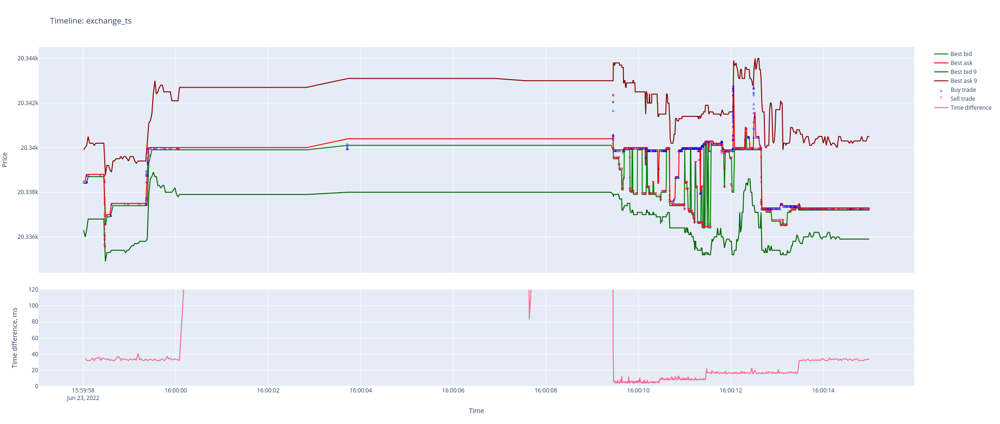

In [18]:
%%capture --no-display
start = '2022-06-23 15:59:58'
end = '2022-06-23 16:00:15'
fig = plot_history(lobs_btc, trades_btc, start, end, timeline='exchange_ts');
fig.update_layout(width=1300, height=900)
fig['layout']['yaxis2'].update(range=[0, 120])
fig.show()

Looks like approximately at 16:00 exchange experienced a glitch and for several seconds the frequency of updates of the order book data dropped greatly. Then, approximately at 16:00:09.500, the frequency returned to the normal range, and, moreover, increased up to several ms$^{-1}$, as if to compensate for the occured lag. Over the course of the next few seconds, it gradually returned to the usual value of 32 ms.

On the receiving timeline the time difference behaves a bit differently, but the general principle stays the same.

# 2. Statistics

## Trade size

### Quantiles

In [19]:
trades_quantiles = []
for i, q in enumerate(range(5, 100, 5)):
    trades_quantiles.append(trades_btc['size'].quantile(q * 0.01))
    print(f'{q}% quantile:', trades_quantiles[-1])

5% quantile: 0.001
10% quantile: 0.001
15% quantile: 0.001
20% quantile: 0.001
25% quantile: 0.002
30% quantile: 0.003
35% quantile: 0.005
40% quantile: 0.009
45% quantile: 0.011
50% quantile: 0.017
55% quantile: 0.025
60% quantile: 0.035
65% quantile: 0.05
70% quantile: 0.066
75% quantile: 0.097
80% quantile: 0.122
85% quantile: 0.191
90% quantile: 0.273
95% quantile: 0.519


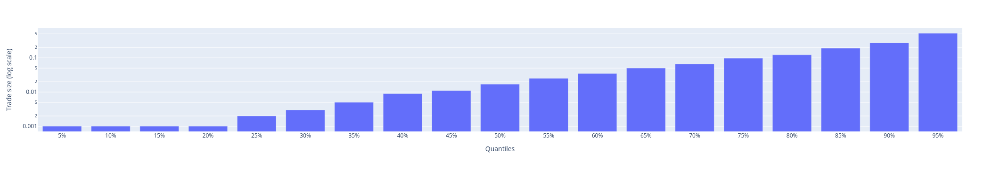

In [20]:
fig = px.bar(trades_quantiles)
fig.update_layout(xaxis=dict(tickmode='array', tickvals=list(range(len(trades_quantiles))), ticktext=[f'{q}%' for q in range(5, 100, 5)]))
fig.update_layout(xaxis_title='Quantiles', yaxis_title='Trade size (log scale)', showlegend=False, yaxis_type='log')
fig.show()

The majority of trades have small volume.

### Median, mean, variance

In [21]:
trades_median = trades_btc['size'].median()
trades_mean = trades_btc['size'].mean()
trades_var = trades_btc['size'].var()
trades_std = np.sqrt(trades_var)

In [22]:
print('Median:', str(trades_median)[:7])
print('Mean:', str(trades_mean)[:7])
print('Variance:', str(trades_var)[:7])
print('Std. dev.:', str(trades_std)[:7])

Median: 0.017
Mean: 0.12200
Variance: 0.31323
Std. dev.: 0.55967


# 3. Histograms

## Trade size

In [ ]:
fig = px.histogram(trades_btc, x='size')
fig.update_xaxes(range=[0, 1.1])
fig.update_yaxes(range=[0, 430000])
fig.update_layout(width=1300, height=900)
fig.show(renderer='browser')

![trade-size-histogram.png](pics/btc/trade-size-histogram.png)

The histogram resembles the function $y = \frac{1}{x}$, in other words, it seems like the frequency of a trade is inversely proportional to the size of a trade. The histogram also has an interesing characteristic that there are spikes of frequencies for some particular values of size, such as 0.05, 0.1, 0.2, 0.25, 0.4, 0.5, 0.6, 0.8, 1, 1.5, 2, 3, 4, and other numbers with 1 or less decimal places.  That can be explained by the fact that people usually consider these numbers to be more beautiful and regular than the numbers with more decimal places, and often use it when making trade orders.

Interestingly, it looks like the frequency for a trade with round trade size is also inversely proportional to the trade size and has its own separate discrete distribution.

## Bid/ask levels

We will look at the best 5 levels.

In [24]:
lobs_cum_btc = lobs_btc.copy()

# drop columns with price information
for i in range(10):
    lobs_cum_btc.drop([f'ask_price_{i}', f'bid_price_{i}'], axis=1, inplace=True)

# drop unnecessary price levels
for i in range(5, 9+1):
    lobs_cum_btc.drop([f'ask_vol_{i}', f'bid_vol_{i}'], axis=1, inplace=True)

# calculate cumulative volume
for i in range(1, 4+1):
    lobs_cum_btc[f'ask_vol_{i}'] = lobs_cum_btc[f'ask_vol_{i}'].add(lobs_cum_btc[f'ask_vol_{i - 1}'])
    lobs_cum_btc[f'bid_vol_{i}'] = lobs_cum_btc[f'bid_vol_{i}'].add(lobs_cum_btc[f'bid_vol_{i - 1}'])

In [ ]:
for i in range(4+1):
    fig = go.Figure()
    fig.add_trace(go.Histogram(x=lobs_cum_btc[f'ask_vol_{i}'], name=f'ask_vol_{i} (cumul)'))
    fig.add_trace(go.Histogram(x=lobs_cum_btc[f'bid_vol_{i}'], name=f'bid_vol_{i} (cumul)'))
    fig.update_layout(barmode='overlay', xaxis_title='Trade volume', yaxis_title='Count')
    fig.update_traces(opacity=0.75)
    fig.update_xaxes(range=[0, 15])
    fig.update_layout(width=1100, height=600)
    fig.show(renderer='browser')

![bid-ask-0-vol-cumul-hist.png](pics/btc/bid-ask-0-vol-cumul-hist.png)

![bid-ask-1-vol-cumul-hist.png](pics/btc/bid-ask-1-vol-cumul-hist.png)

![bid-ask-2-vol-cumul-hist.png](pics/btc/bid-ask-2-vol-cumul-hist.png)

![bid-ask-3-vol-cumul-hist.png](pics/btc/bid-ask-3-vol-cumul-hist.png)

![bid-ask-4-vol-cumul-hist.png](pics/btc/bid-ask-4-vol-cumul-hist.png)

Histograms for ask and bid cumulative volume on the same level are almost identical. For the first levels the histogram resembles the function $y = \frac{1}{x}$. For deeper order book levels, the mode of a distribution shifts to the right.

# 4. Dependence of the best ask/bid price change on the trade size

Every trade in our data is a match between a taker order or its part and a maker order or its part. Therefore, it is more correct to say that the market taking *order* pierces the order book, not the trade. But we do not have the data about the actual orders, so we can only make assumptions that the taker order was executed. One way to do this is to assume that the sequence of trades that have the same timestamp on the exchange timeline is caused by a single taker order.

Having that established, there are two ways to calculate the change of the best price caused by that taker order:
1. difference between the price of the last and the first trade in a sequence;
2. difference between the closest best ask (bid) price that preceds the first trade from a sequence, and the closest best ask (bid) price after the last trade from a sequence.

The disadvantage of the second approach is that the time difference between the order book datapoints is relatively high compared to the time difference between the trades. Also, as described above, time difference between the order book datapoints can increase several times when the trading activity is high. For that reason, I will use the first approach.

In [26]:
trades_btc.head()

,receive_ts,exchange_ts,aggro_side,price,size
0,2022-06-23 00:00:02.624789714,2022-06-23 00:00:02.623,BID,19977.5,0.001
1,2022-06-23 00:00:05.293556247,2022-06-23 00:00:05.292,BID,19977.5,0.041
2,2022-06-23 00:00:05.293628020,2022-06-23 00:00:05.292,BID,19977.5,0.036
3,2022-06-23 00:00:05.293832021,2022-06-23 00:00:05.292,BID,19977.5,0.001
4,2022-06-23 00:00:05.293929517,2022-06-23 00:00:05.292,BID,19977.5,0.001


In [6]:
trades_agg_btc = trades_btc.drop(['receive_ts'], axis=1)\
    .groupby(['exchange_ts', 'aggro_side'])\
    .agg({'price': ['first', 'last'], 'size': 'sum'})

trades_agg_btc.columns = trades_agg_btc.columns.map('_'.join)  # flatten MultiIndex
trades_agg_btc['price_change'] = trades_agg_btc.pop('price_last') - trades_agg_btc.pop('price_first')
trades_agg_btc = trades_agg_btc.groupby('aggro_side')

trades_agg_bid_btc = trades_agg_btc.get_group('BID').copy()
trades_agg_ask_btc = trades_agg_btc.get_group('ASK').copy()
trades_agg_bid_btc.size_sum = (trades_agg_bid_btc.size_sum * 1000).round().astype(int)
trades_agg_ask_btc.size_sum = (trades_agg_ask_btc.size_sum * 1000).round().astype(int)

lob_pierces_bid = trades_agg_bid_btc.groupby('size_sum').agg('mean')
lob_pierces_ask = trades_agg_ask_btc.groupby('size_sum').agg('mean')

Here I drop the values of change that are less than zero for buy orders, and greater than zero for sell orders. They probably occur when at some moment of time on the exchange timeline a maker order in the opposite direction is created somewhere between the first and the last trade in a sequence that I assume to be caused by a single taker order (as described above). This is the limitation of the way I decided to deduce the taker order size. But because there is only a small amount of such anomalies, and because we don't have the actual information about taker orders, that should not be a problem in the scope of this analysis.

In [7]:
lob_pierces_bid = lob_pierces_bid[lob_pierces_bid.price_change >= 0]
lob_pierces_ask = lob_pierces_ask[lob_pierces_ask.price_change <= 0]

Let's look at the plots.

In [10]:
%%capture --no-display
fig = go.Figure(go.Line(
    x = lob_pierces_bid.index * 0.001,
    y = lob_pierces_bid['price_change'],
    hovertemplate = 'Order size: %{x}<br>Price change: %{y}<extra></extra>'
))
fig.update_layout(xaxis_title='Deduced order size', yaxis_title='Mean price change',
                  title='Dependence of the best ask price change on the executed order size',
                  showlegend=False)
fig.show(renderer='browser')

Opening in existing browser session.


[16337:16362:0927/195143.634176:ERROR:bus.cc(399)] Failed to connect to the bus: Could not parse server address: Unknown address type (examples of valid types are "tcp" and on UNIX "unix")
[16337:16362:0927/195143.634261:ERROR:bus.cc(399)] Failed to connect to the bus: Could not parse server address: Unknown address type (examples of valid types are "tcp" and on UNIX "unix")


Markers plot

In [12]:
%%capture --no-display
fig = go.Figure(go.Line(
    x = lob_pierces_bid.index * 0.001,
    y = lob_pierces_bid['price_change'],
    mode='markers',
    hovertemplate = 'Order size: %{x}<br>Price change: %{y}<extra></extra>'
))
fig.update_layout(xaxis_title='Deduced order size', yaxis_title='Mean price change',
                  title='Dependence of the best ask price change on the executed order size',
                  showlegend=False)
fig.show(renderer='browser')

Opening in existing browser session.


[23918:23942:0927/200047.163497:ERROR:bus.cc(399)] Failed to connect to the bus: Could not parse server address: Unknown address type (examples of valid types are "tcp" and on UNIX "unix")
[23918:23942:0927/200047.164237:ERROR:bus.cc(399)] Failed to connect to the bus: Could not parse server address: Unknown address type (examples of valid types are "tcp" and on UNIX "unix")


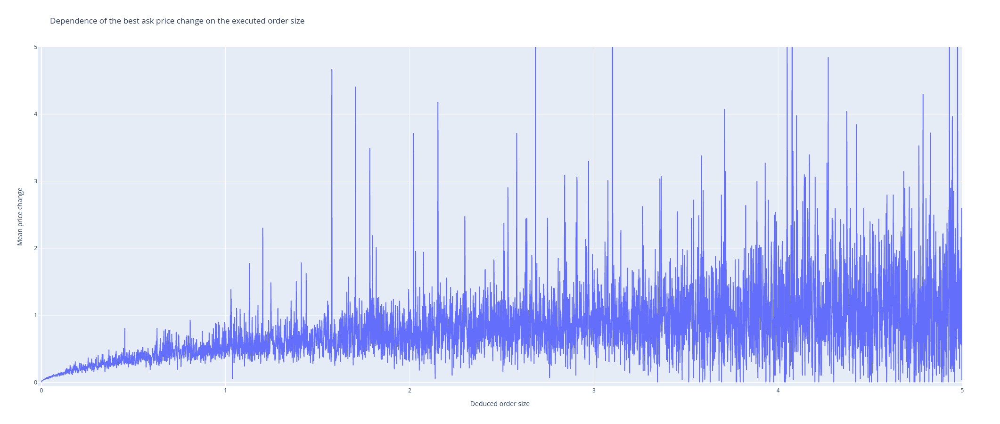

In [30]:
%%capture --no-display
fig = go.Figure(go.Line(
    x = lob_pierces_bid.index * 0.001,
    y = lob_pierces_bid['price_change'],
    hovertemplate = 'Order size: %{x}<br>Price change: %{y}<extra></extra>'
))
fig.update_layout(xaxis_title='Deduced order size', yaxis_title='Mean price change',
                  title='Dependence of the best ask price change on the executed order size',
                  width=1300, height=900, showlegend=False)
fig.update_xaxes(range=[-0.02, 5])
fig.update_yaxes(range=[-0.06, 5])

In [11]:
%%capture --no-display
fig = go.Figure(go.Line(
    x = lob_pierces_ask.index * 0.001,
    y = lob_pierces_ask['price_change']*-1,
    line=dict(color='red'),
    hovertemplate = 'Order size: %{x}<br>Price change: %{y}<extra></extra>'
))
fig.update_layout(xaxis_title='Deduced order size', yaxis_title='-1 * Mean price change',
                  title='Dependence of the best bid price change on the executed order size',
                  showlegend=False)
fig.show(renderer='browser')

Opening in existing browser session.


[16523:16552:0927/195152.645357:ERROR:bus.cc(399)] Failed to connect to the bus: Could not parse server address: Unknown address type (examples of valid types are "tcp" and on UNIX "unix")
[16523:16552:0927/195152.646073:ERROR:bus.cc(399)] Failed to connect to the bus: Could not parse server address: Unknown address type (examples of valid types are "tcp" and on UNIX "unix")


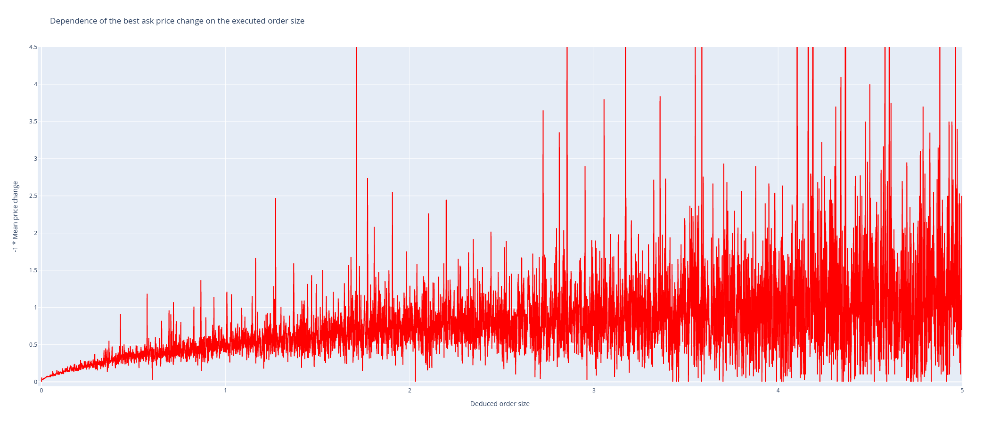

In [32]:
%%capture --no-display
fig = go.Figure(go.Line(
    x = lob_pierces_ask.index * 0.001,
    y = lob_pierces_ask['price_change']*-1,
    line=dict(color='red'),
    hovertemplate = 'Order size: %{x}<br>Price change: %{y}<extra></extra>'
))
fig.update_layout(xaxis_title='Deduced order size', yaxis_title='-1 * Mean price change',
                  title='Dependence of the best ask price change on the executed order size',
                  width=1300, height=900, showlegend=False)
fig.update_xaxes(range=[-0.02, 5])
fig.update_yaxes(range=[-0.06, 4.5])

We can see that this is a random process. This is logical, because the price change after the order execution depends not only on the size of the order, but also on the limit orders volume in the order book, which is a random process by itself. We can observe that the variance increases greatly with the increase of order size, but at some point it starts to decrease. The mean grows slowly and resembles the function $y = \ln(x)$.